In [1]:
#Import libraries
import pandas as pd
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem, MACCSkeys
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

In [2]:
#FooDB database, add 'DATASET' column: FooDB
Food = pd.read_csv("foodb_curated.csv")
Food['DATASET'] = "FooDB"
Food.head(2)

,ID,PUBLIC_ID,NAME,SMILES,SMILES_chiral,SMILES_no_chiral,DATASET
0,4,FDB000004,Cyanidin 3-(6''-acetyl-galactoside),[H][C@]1(COC(C)=O)O[C@@]([H])(OC2=CC3=C(O)C=C(...,CC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc3[o+]c2...,CC(=O)OCC1OC(Oc2cc3c(O)cc(O)cc3[o+]c2-c2ccc(O)...,FooDB
1,13,FDB000013,Cyanidin 3-(6''-succinyl-glucoside),[H][C@]1(COC(=O)CCC(O)=O)O[C@@]([H])(OC2=CC3=C...,O=C(O)CCC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc...,O=C(O)CCC(=O)OCC1OC(Oc2cc3c(O)cc(O)cc3[o+]c2-c...,FooDB


In [3]:
#UNPD-A database, 'DATASET' column: UNP
NP = pd.read_csv("unpda_curated.csv")
NP["DATASET"] = "UNP"
NP.head(2)

,ID,SMILES_chiral,SMILES_no_chiral,NPL_score,DATASET
0,UNPD_subset_A_1,Cc1cc2c(c(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[...,Cc1cc2c(c(OC3OC(CO)C(O)C(O)C3O)c1O)C(=O)c1c(O)...,2.131,UNP
1,UNPD_subset_A_2,NCCCCNCCCCNCCCCN(CCCCN)CCCCNCCCCN,NCCCCNCCCCNCCCCN(CCCCN)CCCCNCCCCN,-0.188,UNP


In [4]:
#Purchasable compounds from FooDB, 'DATASET' column: PURCH
Purch = pd.read_csv("purch_curated.csv")
Purch["DATASET"] = "PURCH"
Purch.head(2)

,PUBLIC_ID,SMILES,SMILES_chiral,SMILES_no_chiral,VENDORS,DATASET
0,FDB011890,CCCCC1=NC2=CC=CC=C2N1,CCCCc1nc2ccccc2[nH]1,CCCCc1nc2ccccc2[nH]1,True,PURCH
1,FDB008117,OC(=O)CC(O)=O,O=C(O)CC(=O)O,O=C(O)CC(=O)O,True,PURCH


In [5]:
#DrugBank database, 'DATABASE_NAME': drugbank
FDA = pd.read_csv("fda_curated.csv")
FDA.head(2)

,ID,DATABASE_NAME,DRUG_GROUPS,GENERIC_NAME,SYNONYMS,SMILES,SMILES_chiral,SMILES_no_chiral
0,DB00006,drugbank,approved; investigational,Bivalirudin,Bivalirudin; Bivalirudina; Bivalirudinum,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(O)=O)NC(=O)[C@...,CC[C@H](C)C(NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](C...,CCC(C)C(NC(=O)C(CCC(=O)O)NC(=O)C(CCC(=O)O)NC(=...
1,DB00007,drugbank,approved; investigational,Leuprolide,Leuprorelin; Leuprorelina; Leuproreline; Leupr...,CCNC(=O)[C@@H]1CCCN1C(=O)[C@H](CCCNC(N)=N)NC(=...,CCNC(=O)C1CCCN1C(=O)[C@H](CCCN=C(N)N)NC(=O)[C@...,CCNC(=O)C1CCCN1C(=O)C(CCCN=C(N)N)NC(=O)C(CC(C)...


In [6]:
#Print columns for each dataframe
print(FDA.columns)
print(Food.columns)
print(NP.columns)
print(Purch.columns)

Index(['ID', 'DATABASE_NAME', 'DRUG_GROUPS', 'GENERIC_NAME', 'SYNONYMS',
       'SMILES', 'SMILES_chiral', 'SMILES_no_chiral'],
      dtype='object')
Index(['ID', 'PUBLIC_ID', 'NAME', 'SMILES', 'SMILES_chiral',
       'SMILES_no_chiral', 'DATASET'],
      dtype='object')
Index(['ID', 'SMILES_chiral', 'SMILES_no_chiral', 'NPL_score', 'DATASET'], dtype='object')
Index(['PUBLIC_ID', 'SMILES', 'SMILES_chiral', 'SMILES_no_chiral', 'VENDORS',
       'DATASET'],
      dtype='object')


In [7]:
#Select necessary columns
FDA = FDA[['ID', 'DATABASE_NAME', 'SMILES_chiral']]
Food = Food[['ID', 'DATASET', 'SMILES_chiral']]
NP = NP[['ID', 'DATASET', 'SMILES_chiral']]
Purch = Purch[['PUBLIC_ID', 'DATASET', 'SMILES_chiral']]
#Change names to match columns
FDA.columns = ["ID", "DATABASE_NAME", "SMILES_chiral"]
Food.columns = ["ID", "DATABASE_NAME", "SMILES_chiral"]
NP.columns = ["ID", "DATABASE_NAME", "SMILES_chiral"]
Purch.columns = ["ID", "DATABASE_NAME", "SMILES_chiral"]
NP.head(2)

,ID,DATABASE_NAME,SMILES_chiral
0,UNPD_subset_A_1,UNP,Cc1cc2c(c(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[...
1,UNPD_subset_A_2,UNP,NCCCCNCCCCNCCCCN(CCCCN)CCCCNCCCCN


In [8]:
#Concatenate four databases
DATA = pd.concat([Food, NP, Purch, FDA], axis=0).reset_index(drop=True)
DATA.head()

,ID,DATABASE_NAME,SMILES_chiral
0,4,FooDB,CC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc3[o+]c2...
1,13,FooDB,O=C(O)CCC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc...
2,14,FooDB,O=C(O)CCC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc...
3,24,FooDB,COc1cc(-c2[o+]c3cc(O)cc(O)c3cc2OC2O[C@H](COC(C...
4,25,FooDB,COc1cc(-c2[o+]c3cc(O)cc(O)c3cc2OC2O[C@H](COC(C...


In [9]:
#Verify number of compounds
DATA.shape

(89306, 3)

In [10]:
#MACCS Keys
df_MACCS_Keys=pd.DataFrame([[int(y) for y in MACCSkeys.GenMACCSKeys(Chem.MolFromSmiles(x)).ToBitString()] for x in DATA["SMILES_chiral"]])

RDKit WARNING: [01:36:48] WARNING: not removing hydrogen atom without neighbors
[01:36:48] WARNING: not removing hydrogen atom without neighbors


In [11]:
#MACCS dataframe
df_MACCS_Keys.head(2)

,0,1,2,3,4,5,6,7,8,9,...,157,158,159,160,161,162,163,164,165,166
0,0,0,0,0,0,0,0,0,0,0,...,1,0,1,1,0,1,1,1,1,0
1,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,1,1,1,1,0


In [12]:
#Compute tSNE from MACCS Keys fingerprint, perplexity: 30, 5000 iterations
data_tsne_30 = df_MACCS_Keys.copy()
data_tsne_30 = StandardScaler().fit_transform(data_tsne_30)
tsne_30 = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=5000)
tsne_results_30 = tsne_30.fit_transform(data_tsne_30)

/home/invitado/anaconda3/envs/ChemSpace/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/invitado/anaconda3/envs/ChemSpace/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 89306 samples in 0.006s...
[t-SNE] Computed neighbors for 89306 samples in 96.961s...
[t-SNE] Computed conditional probabilities for sample 1000 / 89306
[t-SNE] Computed conditional probabilities for sample 2000 / 89306
[t-SNE] Computed conditional probabilities for sample 3000 / 89306
[t-SNE] Computed conditional probabilities for sample 4000 / 89306
[t-SNE] Computed conditional probabilities for sample 5000 / 89306
[t-SNE] Computed conditional probabilities for sample 6000 / 89306
[t-SNE] Computed conditional probabilities for sample 7000 / 89306
[t-SNE] Computed conditional probabilities for sample 8000 / 89306
[t-SNE] Computed conditional probabilities for sample 9000 / 89306
[t-SNE] Computed conditional probabilities for sample 10000 / 89306
[t-SNE] Computed conditional probabilities for sample 11000 / 89306
[t-SNE] Computed conditional probabilities for sample 12000 / 89306
[t-SNE] Computed conditional probabilities for sa

In [13]:
#Concatenate numpy arrays: label and tSNE results MACCS
label = DATA[["ID", 'SMILES_chiral', 'DATABASE_NAME']]
label = label.to_numpy()
arr = np.concatenate((label, tsne_results_30), axis = 1)

In [14]:
#Create a new dataframe MACCS
tsne_dataset_30 = pd.DataFrame(data=arr, columns=["ID", "SMILES_chiral", 'DATABASE_NAME', 'Component1', 'Component2'] )
tsne_dataset_30

,ID,SMILES_chiral,DATABASE_NAME,Component1,Component2
0,4,CC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc3[o+]c2...,FooDB,-156.979065,-24.367329
1,13,O=C(O)CCC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc...,FooDB,-161.215729,-31.308474
2,14,O=C(O)CCC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc...,FooDB,-161.215729,-31.308474
3,24,COc1cc(-c2[o+]c3cc(O)cc(O)c3cc2OC2O[C@H](COC(C...,FooDB,-155.938416,-23.032541
4,25,COc1cc(-c2[o+]c3cc(O)cc(O)c3cc2OC2O[C@H](COC(C...,FooDB,-155.938446,-23.032551
...,...,...,...,...,...
89301,DB16778,O=C(O)CCC(NC(=O)NC(CCCCNC(=O)[C@H](Cc1ccc2cccc...,drugbank,-87.5905,71.335396
89302,DB16965,CCNCc1nc2c(O)c(Cl)cc(Cl)c2c(=O)n1C,drugbank,28.873554,112.864845
89303,DB17083,COc1cc(F)c(-n2c(=O)[nH]c3csc(C(=O)O)c3c2=O)cc1...,drugbank,40.435444,115.330208
89304,DB17084,O=C(CCC(C(=O)O)N1CCN(C(CCC(=O)NCC(O)CO)C(=O)O)...,drugbank,-31.549011,114.566414


(-250.0, 250.0)

<Figure size 640x480 with 0 Axes>

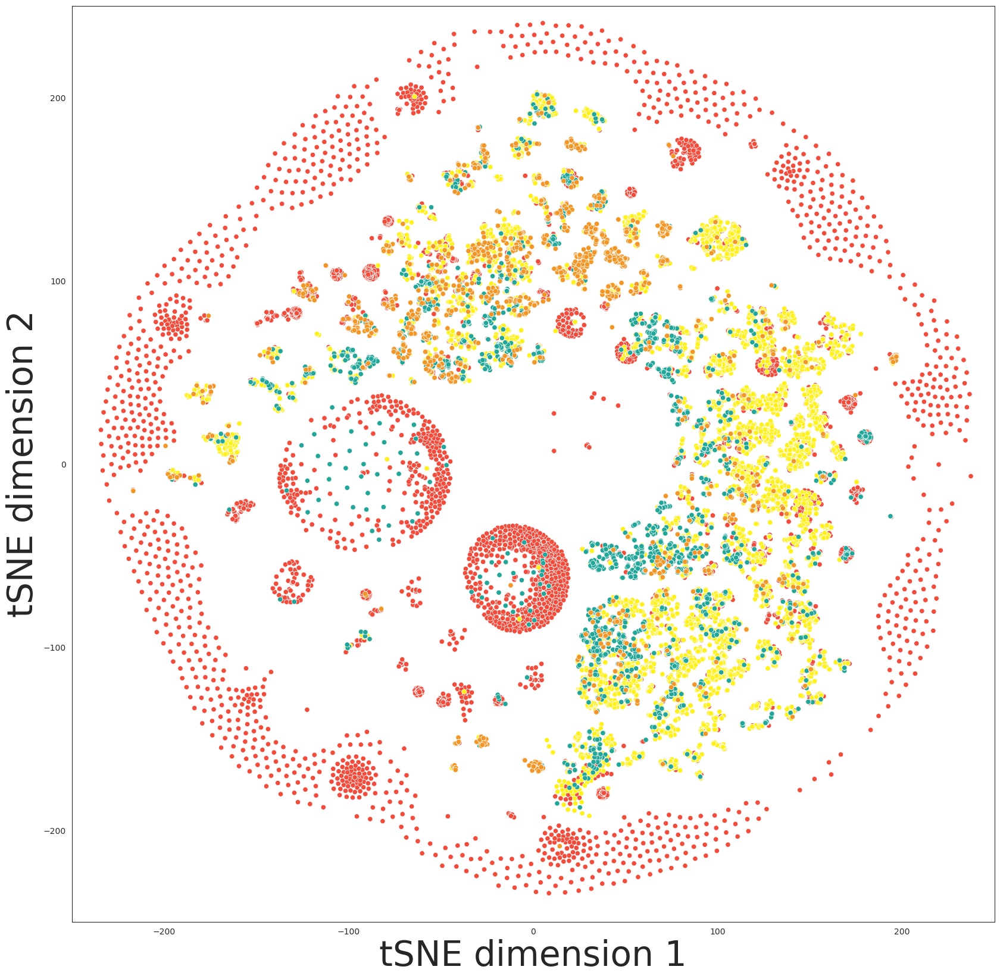

In [15]:
#tSNE visualization, MACCS Keys, four databases

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(20,20))
plt.xlabel("tSNE dimension 1", fontsize=42)
plt.ylabel("tSNE dimension 2", fontsize=42)
sns.set(font_scale=2.5)

#Scatterplot with selected palette
sns.scatterplot(
                x = tsne_dataset_30["Component1"],
                y = tsne_dataset_30["Component2"],
                hue = tsne_dataset_30["DATABASE_NAME"], #Label
                palette=['#F24C3D', '#FFF11E', '#22A699', '#F29727']
                )

#Axis
plt.legend().remove()
plt.ylim(-250, 250)
plt.xlim(-250, 250)

#Save plot file
plt.savefig('tsne_MACCS_2', dpi=300)

(-250.0, 250.0)

<Figure size 640x480 with 0 Axes>

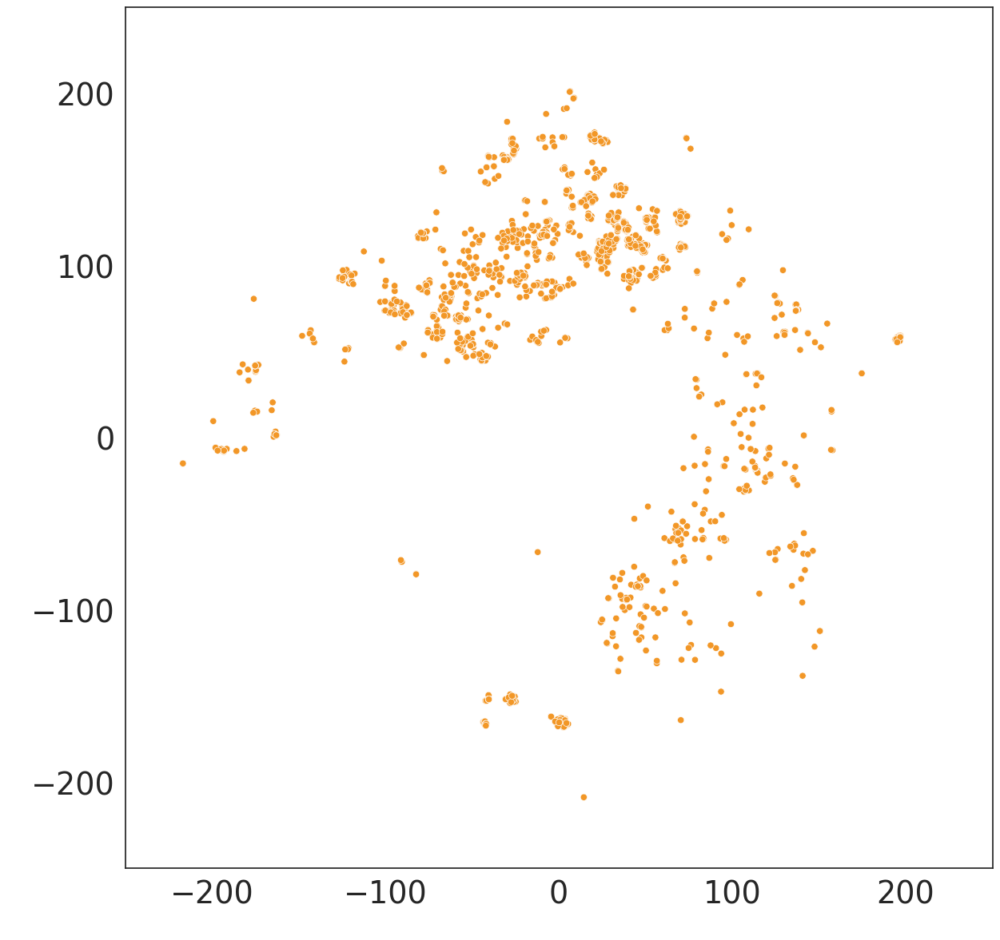

In [16]:
#tSNE visualization, MACCS Keys, DrugBank database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)

#Select one database
tsne_dataset_FDA = tsne_dataset_30[tsne_dataset_30["DATABASE_NAME"].str.contains("drugbank")]


#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_FDA["Component1"],
                y = tsne_dataset_FDA["Component2"],
                hue = tsne_dataset_FDA["DATABASE_NAME"], 
                palette=['#F29727']
                )

#Axis
plt.legend().remove()
plt.ylim(-250, 250)
plt.xlim(-250, 250)

#Save plot file
plt.savefig('tsne_FDA_2', dpi=300)

(-250.0, 250.0)

<Figure size 640x480 with 0 Axes>

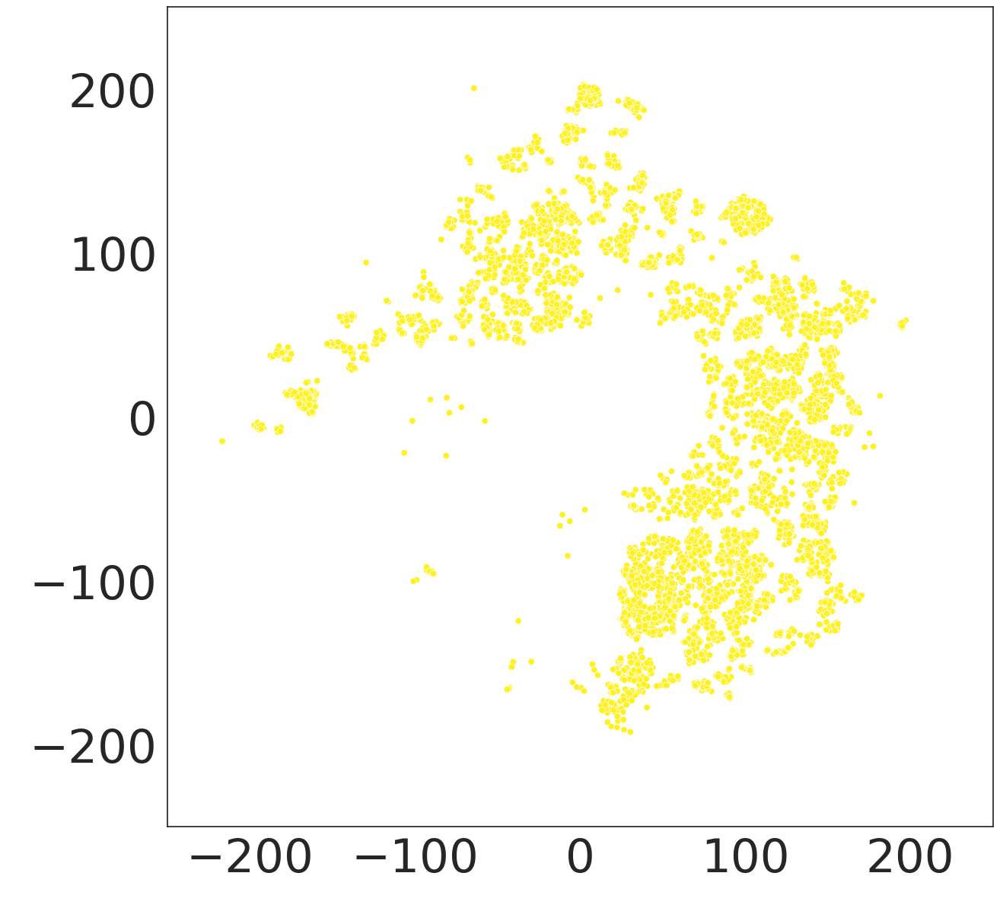

In [17]:
#tSNE visualization, MACCS Keys, UNPD-A database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)


#Select one database
tsne_dataset_UNP = tsne_dataset_30[tsne_dataset_30["DATABASE_NAME"].str.contains("UNP")]


#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_UNP["Component1"],
                y = tsne_dataset_UNP["Component2"],
                hue = tsne_dataset_UNP["DATABASE_NAME"], 
                palette=['#FFF11E']
                )

#Axis
plt.legend().remove()
plt.ylim(-250, 250)
plt.xlim(-250, 250)

#Save plot file
plt.savefig('tsne_UNP_2', dpi=300)

(-250.0, 250.0)

<Figure size 640x480 with 0 Axes>

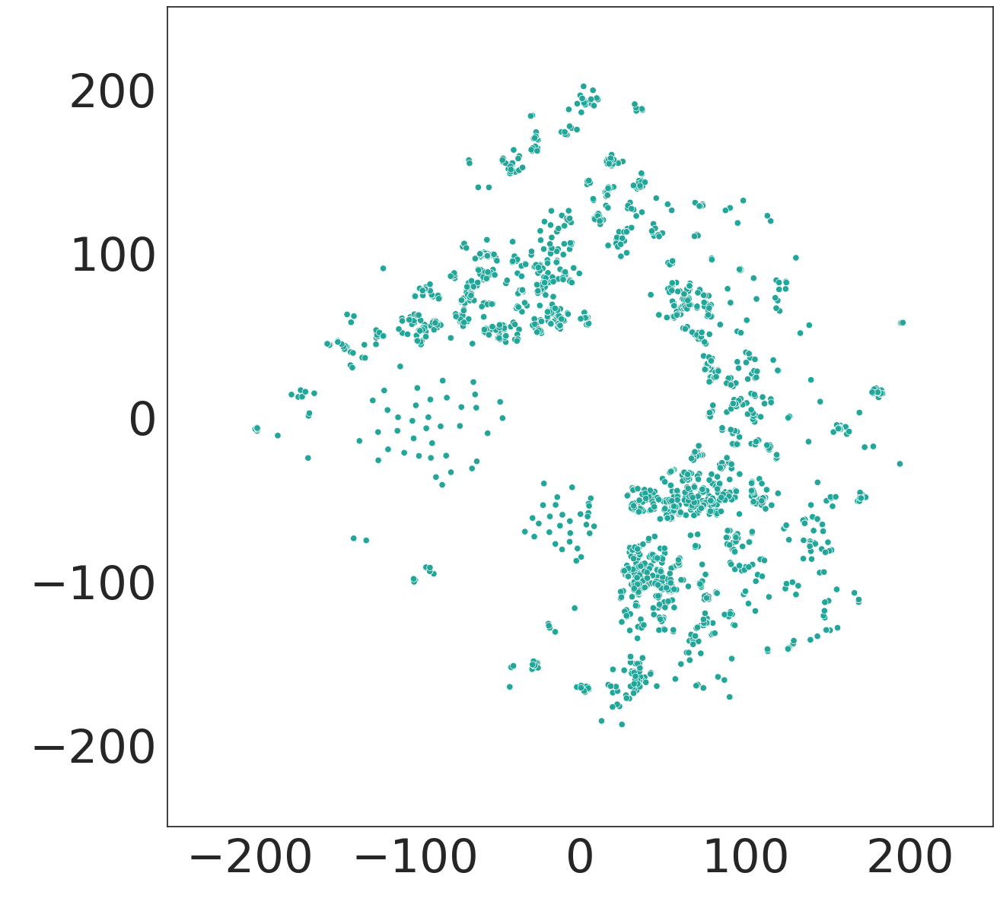

In [18]:
#tSNE visualization, MACCS Keys, Purchasable FooDB database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)


#Select one database
tsne_dataset_Purch = tsne_dataset_30[tsne_dataset_30["DATABASE_NAME"].str.contains("PURCH")]


#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_Purch["Component1"],
                y = tsne_dataset_Purch["Component2"],
                hue = tsne_dataset_Purch["DATABASE_NAME"], 
                palette=['#22A699']
                )


#Axis
plt.legend().remove()
plt.ylim(-250, 250)
plt.xlim(-250, 250)

#Save plot file
plt.savefig('tsne_Purch_2', dpi=300)

(-250.0, 250.0)

<Figure size 640x480 with 0 Axes>

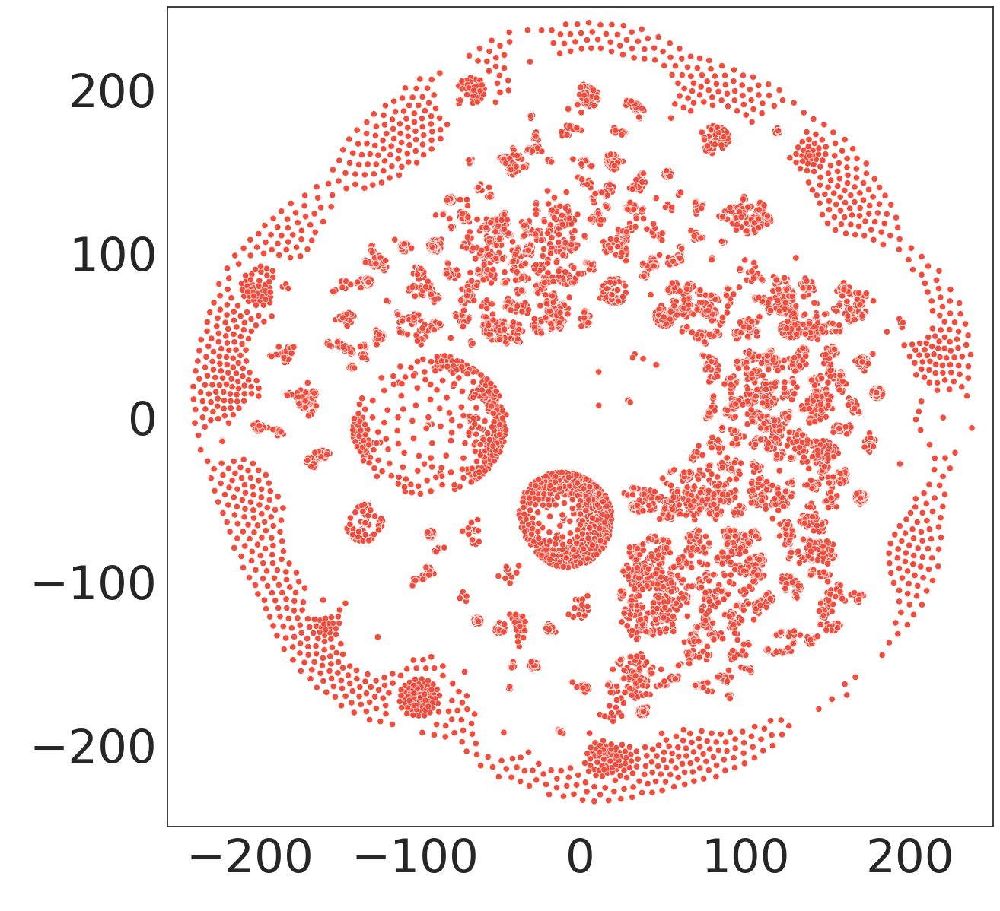

In [19]:
#tSNE visualization, MACCS Keys,FooDB database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)


#Select one database
tsne_dataset_Food = tsne_dataset_30[tsne_dataset_30["DATABASE_NAME"].str.contains("FooDB")]

#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_Food["Component1"],
                y = tsne_dataset_Food["Component2"],
                hue = tsne_dataset_Food["DATABASE_NAME"], 
                palette=['#F24C3D']
                )

#Axis
plt.legend().remove()
plt.ylim(-250, 250)
plt.xlim(-250, 250)

#Save plot file
plt.savefig('tsne_Food_2', dpi=300)

In [20]:
#ECFP4
df_ECFP4 = pd.DataFrame([[int(y) for y in AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), 2, nBits=1024).ToBitString()] for x in DATA["SMILES_chiral"]])

RDKit WARNING: [02:12:17] WARNING: not removing hydrogen atom without neighbors
[02:12:17] WARNING: not removing hydrogen atom without neighbors


In [21]:
#ECFP4 dataframe
df_ECFP4.head(2)

,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0


In [22]:
#Compute tSNE from ECFP4 fingerprint, perplexity: 30, 5000 iterations
data_tsne_ecfp4 = df_ECFP4.copy()
data_tsne_ecfp4 = StandardScaler().fit_transform(data_tsne_ecfp4)
tsne_ecfp4 = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=5000)
tsne_results_ecfp4 = tsne_ecfp4.fit_transform(data_tsne_ecfp4)

/home/invitado/anaconda3/envs/ChemSpace/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/invitado/anaconda3/envs/ChemSpace/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 89306 samples in 0.036s...
[t-SNE] Computed neighbors for 89306 samples in 122.898s...
[t-SNE] Computed conditional probabilities for sample 1000 / 89306
[t-SNE] Computed conditional probabilities for sample 2000 / 89306
[t-SNE] Computed conditional probabilities for sample 3000 / 89306
[t-SNE] Computed conditional probabilities for sample 4000 / 89306
[t-SNE] Computed conditional probabilities for sample 5000 / 89306
[t-SNE] Computed conditional probabilities for sample 6000 / 89306
[t-SNE] Computed conditional probabilities for sample 7000 / 89306
[t-SNE] Computed conditional probabilities for sample 8000 / 89306
[t-SNE] Computed conditional probabilities for sample 9000 / 89306
[t-SNE] Computed conditional probabilities for sample 10000 / 89306
[t-SNE] Computed conditional probabilities for sample 11000 / 89306
[t-SNE] Computed conditional probabilities for sample 12000 / 89306
[t-SNE] Computed conditional probabilities for s

In [23]:
#Concatenate numpy arrays: label and tSNE results ECFP4
label = DATA[["ID", 'SMILES_chiral', 'DATABASE_NAME']]
label = label.to_numpy()
arr_ecfp4 = np.concatenate((label, tsne_results_ecfp4), axis = 1)

In [24]:
#Create a new dataframe ECFP4
tsne_dataset_ecfp4 = pd.DataFrame(data=arr_ecfp4, columns=["ID", "SMILES_chiral", 'DATABASE_NAME', 'Component1', 'Component2'] )
tsne_dataset_ecfp4

,ID,SMILES_chiral,DATABASE_NAME,Component1,Component2
0,4,CC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc3[o+]c2...,FooDB,42.549061,134.175446
1,13,O=C(O)CCC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc...,FooDB,43.652138,131.774506
2,14,O=C(O)CCC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc...,FooDB,43.565193,131.735031
3,24,COc1cc(-c2[o+]c3cc(O)cc(O)c3cc2OC2O[C@H](COC(C...,FooDB,42.576351,134.640121
4,25,COc1cc(-c2[o+]c3cc(O)cc(O)c3cc2OC2O[C@H](COC(C...,FooDB,42.538094,134.421188
...,...,...,...,...,...
89301,DB16778,O=C(O)CCC(NC(=O)NC(CCCCNC(=O)[C@H](Cc1ccc2cccc...,drugbank,-96.563057,-69.010056
89302,DB16965,CCNCc1nc2c(O)c(Cl)cc(Cl)c2c(=O)n1C,drugbank,3.564313,-38.520138
89303,DB17083,COc1cc(F)c(-n2c(=O)[nH]c3csc(C(=O)O)c3c2=O)cc1...,drugbank,-40.527462,-17.764822
89304,DB17084,O=C(CCC(C(=O)O)N1CCN(C(CCC(=O)NCC(O)CO)C(=O)O)...,drugbank,-56.057861,-71.105476


<Figure size 640x480 with 0 Axes>

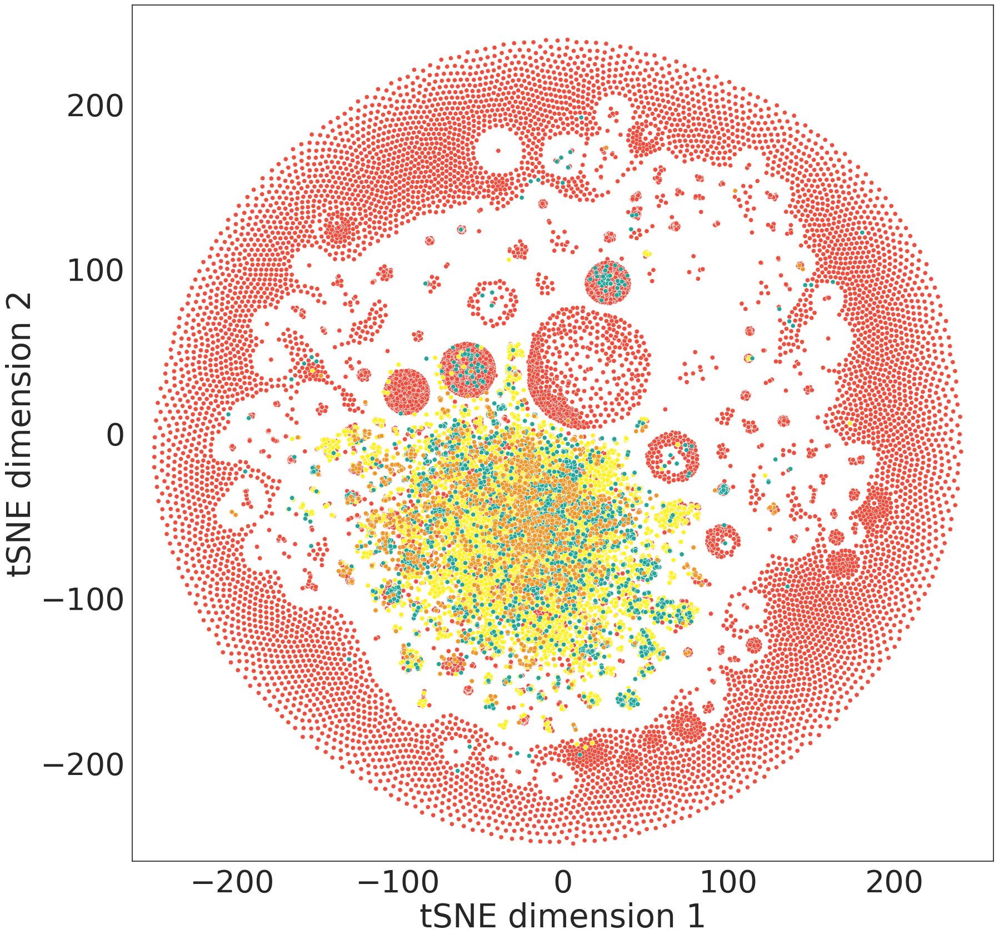

In [25]:
#tSNE visualization, ECFP4, four databases

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(20,20))
plt.xlabel("tSNE dimension 1", fontsize=42)
plt.ylabel("tSNE dimension 2", fontsize=42)
plt.tick_params(axis = 'both', labelsize = 40)
sns.set(font_scale=2.5)


#Scatterplot with selected palette
sns.scatterplot(
                x = tsne_dataset_ecfp4["Component1"],
                y = tsne_dataset_ecfp4["Component2"],
                hue = tsne_dataset_ecfp4["DATABASE_NAME"], #Labels
                palette=['#F24C3D', '#FFF11E', '#22A699', '#F29727']
                )

#Axis
plt.legend().remove()
plt.ylim(-260, 260)
plt.xlim(-260, 260)

#Save plot file
plt.savefig('tsne_ECFP4_2', dpi=300)

<Figure size 640x480 with 0 Axes>

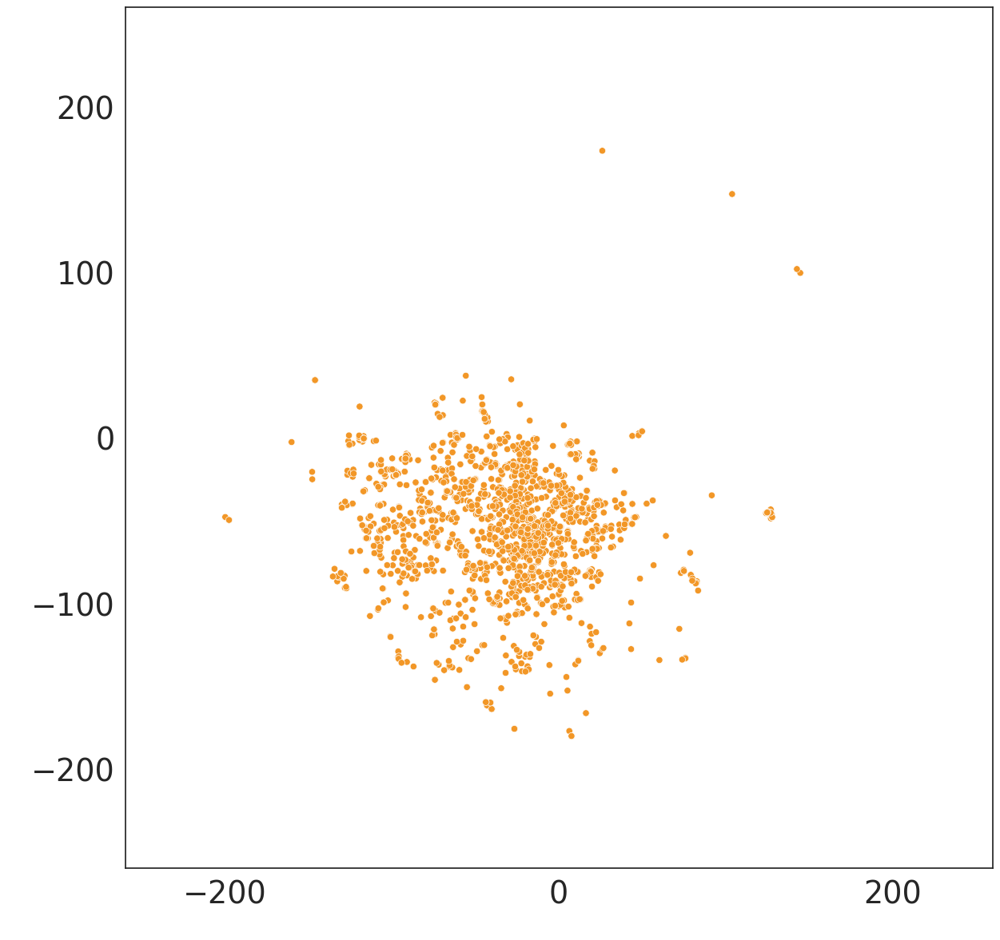

In [26]:
#tSNE visualization, ECFP4, DrugBank database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)


#Select one database
tsne_dataset_FDA_4 = tsne_dataset_ecfp4[tsne_dataset_ecfp4["DATABASE_NAME"].str.contains("drugbank")]


#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_FDA_4["Component1"],
                y = tsne_dataset_FDA_4["Component2"],
                hue = tsne_dataset_FDA_4["DATABASE_NAME"], 
                palette=['#F29727']
                )

#Axis
plt.legend().remove()
plt.ylim(-260, 260)
plt.xlim(-260, 260)

#Save plot file
plt.savefig('tsne_ECFP4_FDA_2', dpi=300)

<Figure size 640x480 with 0 Axes>

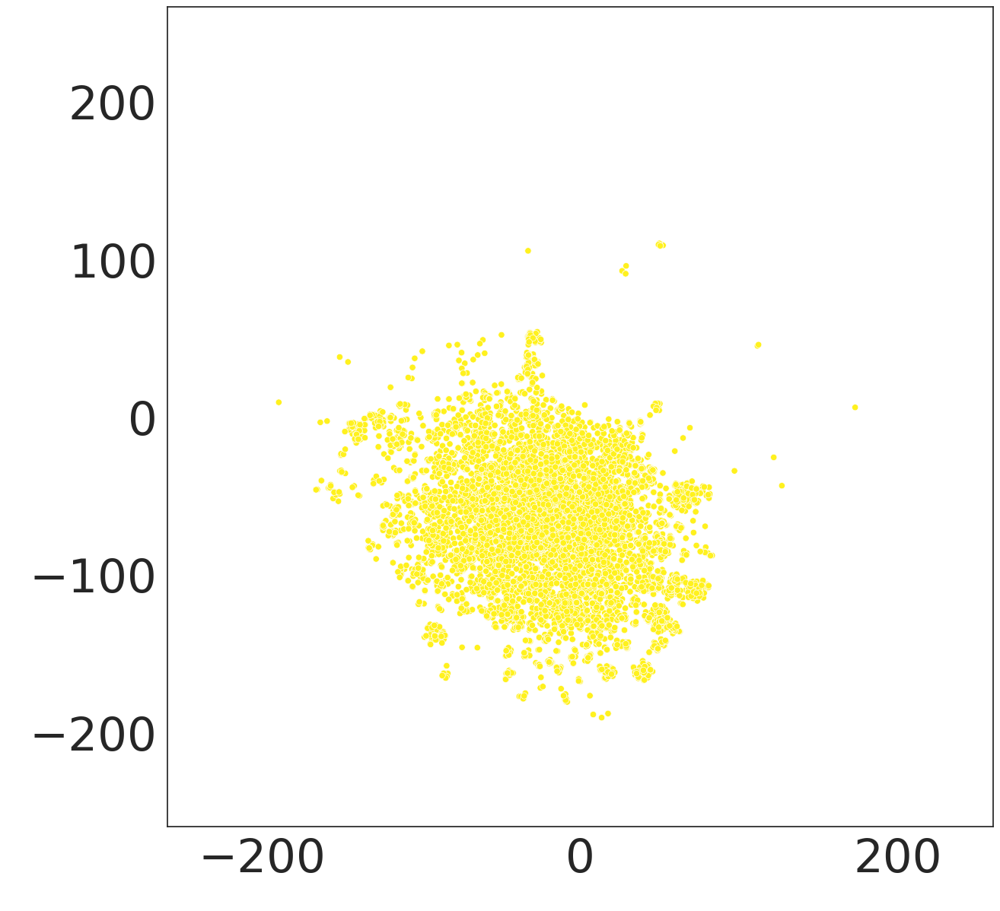

In [27]:
#tSNE visualization, ECFP4, UNPD-A database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)


#Select one database
tsne_dataset_UNP_4 = tsne_dataset_ecfp4[tsne_dataset_ecfp4["DATABASE_NAME"].str.contains("UNP")]

#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_UNP_4["Component1"],
                y = tsne_dataset_UNP_4["Component2"],
                hue = tsne_dataset_UNP_4["DATABASE_NAME"],
                palette=['#FFF11E']
                )

#Axis
plt.legend().remove()
plt.ylim(-260, 260)
plt.xlim(-260, 260)

#Save plot file
plt.savefig('tsne_ECFP4_UNP_2', dpi=300)

<Figure size 640x480 with 0 Axes>

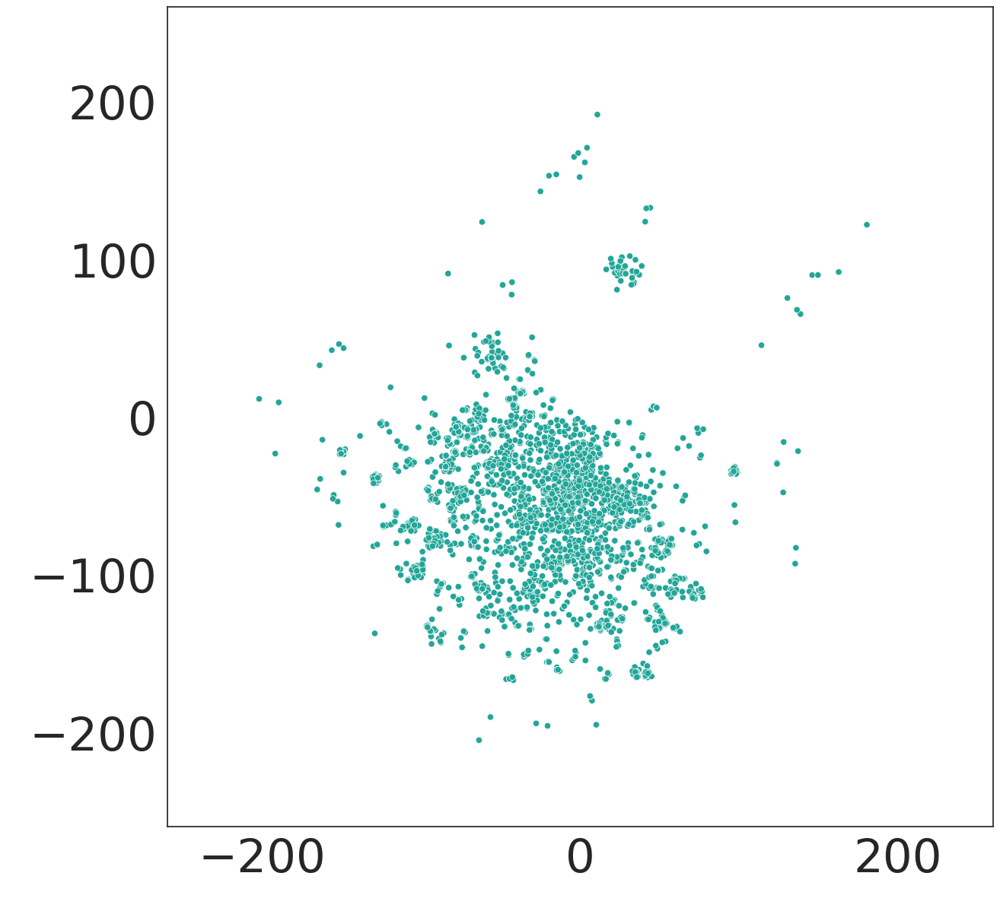

In [28]:
#tSNE visualization, ECFP4, Purchasable FooDB database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)


#Select one database
tsne_dataset_Purch_4 = tsne_dataset_ecfp4[tsne_dataset_ecfp4["DATABASE_NAME"].str.contains("PURCH")]

#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_Purch_4["Component1"],
                y = tsne_dataset_Purch_4["Component2"],
                hue = tsne_dataset_Purch_4["DATABASE_NAME"], 
                palette=['#22A699']
                )

#Axis
plt.legend().remove()
plt.ylim(-260, 260)
plt.xlim(-260, 260)

#Save plot file
plt.savefig('tsne_ECFP4_Purch_2', dpi=300)

<Figure size 640x480 with 0 Axes>

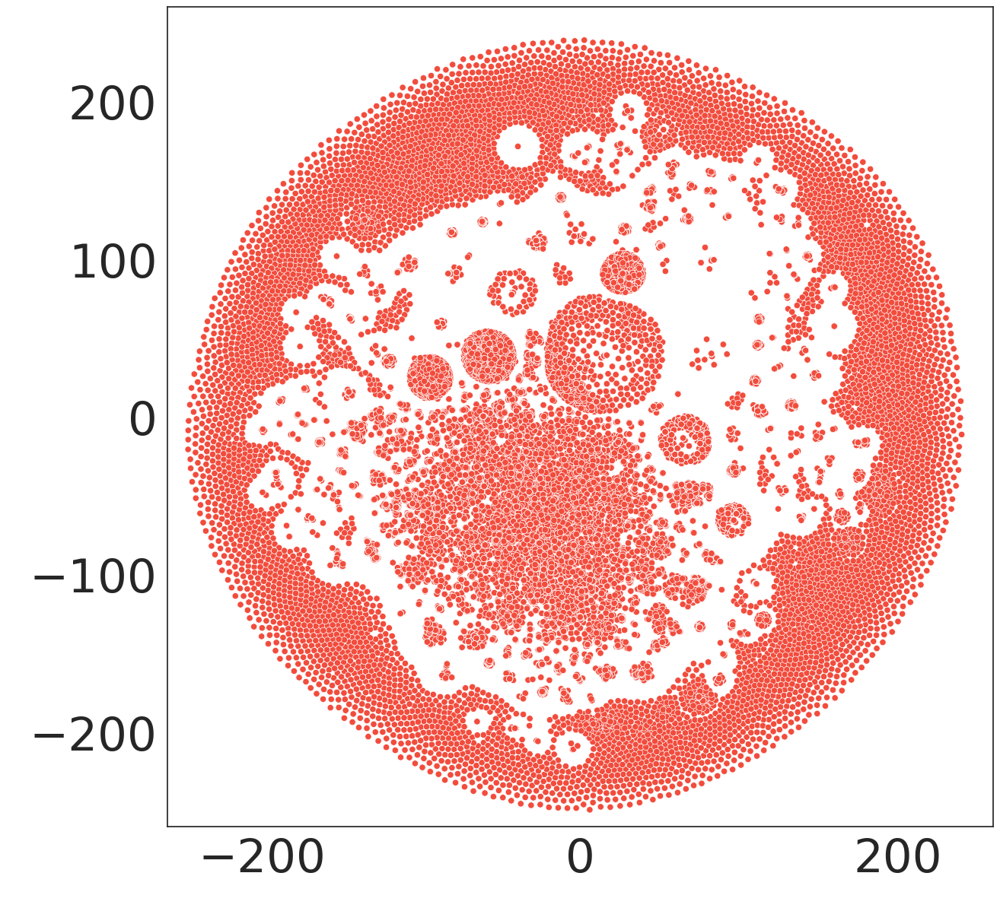

In [29]:
#tSNE visualization, ECFP4, FooDB database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)


#Select one database
tsne_dataset_Food_4 = tsne_dataset_ecfp4[tsne_dataset_ecfp4["DATABASE_NAME"].str.contains("FooDB")]

#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_Food_4["Component1"],
                y = tsne_dataset_Food_4["Component2"],
                hue = tsne_dataset_Food_4["DATABASE_NAME"], 
                palette=['#F24C3D']
                )

#Axis
plt.legend().remove()
plt.ylim(-260, 260)
plt.xlim(-260, 260)

#Save plot file
plt.savefig('tsne_ECFP4_Food_2', dpi=300)

In [30]:
#ECFP6 dataframe
df_ECFP6 = pd.DataFrame([[int(y) for y in AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), 3, nBits=1024).ToBitString()] for x in DATA["SMILES_chiral"]])
df_ECFP6.head(2)

RDKit WARNING: [23:26:21] WARNING: not removing hydrogen atom without neighbors
[23:26:21] WARNING: not removing hydrogen atom without neighbors


,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0


In [31]:
#Compute tSNE from ECFP6 fingerprint, perplexity: 30, 5000 iterations
data_tsne_ecfp6 = df_ECFP6.copy()
data_tsne_ecfp6 = StandardScaler().fit_transform(data_tsne_ecfp6)
tsne_ecfp6 = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=5000)
tsne_results_ecfp6 = tsne_ecfp6.fit_transform(data_tsne_ecfp6)

/home/invitado/anaconda3/envs/ChemSpace/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/invitado/anaconda3/envs/ChemSpace/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 89306 samples in 0.036s...
[t-SNE] Computed neighbors for 89306 samples in 123.025s...
[t-SNE] Computed conditional probabilities for sample 1000 / 89306
[t-SNE] Computed conditional probabilities for sample 2000 / 89306
[t-SNE] Computed conditional probabilities for sample 3000 / 89306
[t-SNE] Computed conditional probabilities for sample 4000 / 89306
[t-SNE] Computed conditional probabilities for sample 5000 / 89306
[t-SNE] Computed conditional probabilities for sample 6000 / 89306
[t-SNE] Computed conditional probabilities for sample 7000 / 89306
[t-SNE] Computed conditional probabilities for sample 8000 / 89306
[t-SNE] Computed conditional probabilities for sample 9000 / 89306
[t-SNE] Computed conditional probabilities for sample 10000 / 89306
[t-SNE] Computed conditional probabilities for sample 11000 / 89306
[t-SNE] Computed conditional probabilities for sample 12000 / 89306
[t-SNE] Computed conditional probabilities for s

In [32]:
#Concatenate numpy arrays: label and tSNE results ECFP6
label = DATA[["ID", 'SMILES_chiral', 'DATABASE_NAME']]
label = label.to_numpy()
arr_ecfp6 = np.concatenate((label, tsne_results_ecfp6), axis = 1)

In [33]:
#Create a new dataframe ECFP6
tsne_dataset_ecfp6 = pd.DataFrame(data=arr_ecfp6, columns=["ID", "SMILES_chiral", 'DATABASE_NAME', 'Component1', 'Component2'] )
tsne_dataset_ecfp6

,ID,SMILES_chiral,DATABASE_NAME,Component1,Component2
0,4,CC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc3[o+]c2...,FooDB,-49.383942,127.620651
1,13,O=C(O)CCC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc...,FooDB,-49.650101,127.512207
2,14,O=C(O)CCC(=O)OC[C@H]1O[C@@H](Oc2cc3c(O)cc(O)cc...,FooDB,-49.377396,129.273514
3,24,COc1cc(-c2[o+]c3cc(O)cc(O)c3cc2OC2O[C@H](COC(C...,FooDB,-47.728611,130.782318
4,25,COc1cc(-c2[o+]c3cc(O)cc(O)c3cc2OC2O[C@H](COC(C...,FooDB,-48.11113,128.352249
...,...,...,...,...,...
89301,DB16778,O=C(O)CCC(NC(=O)NC(CCCCNC(=O)[C@H](Cc1ccc2cccc...,drugbank,34.395447,-97.279915
89302,DB16965,CCNCc1nc2c(O)c(Cl)cc(Cl)c2c(=O)n1C,drugbank,1.241717,15.914996
89303,DB17083,COc1cc(F)c(-n2c(=O)[nH]c3csc(C(=O)O)c3c2=O)cc1...,drugbank,14.950426,-31.83042
89304,DB17084,O=C(CCC(C(=O)O)N1CCN(C(CCC(=O)NCC(O)CO)C(=O)O)...,drugbank,23.895729,-30.525978


<Figure size 640x480 with 0 Axes>

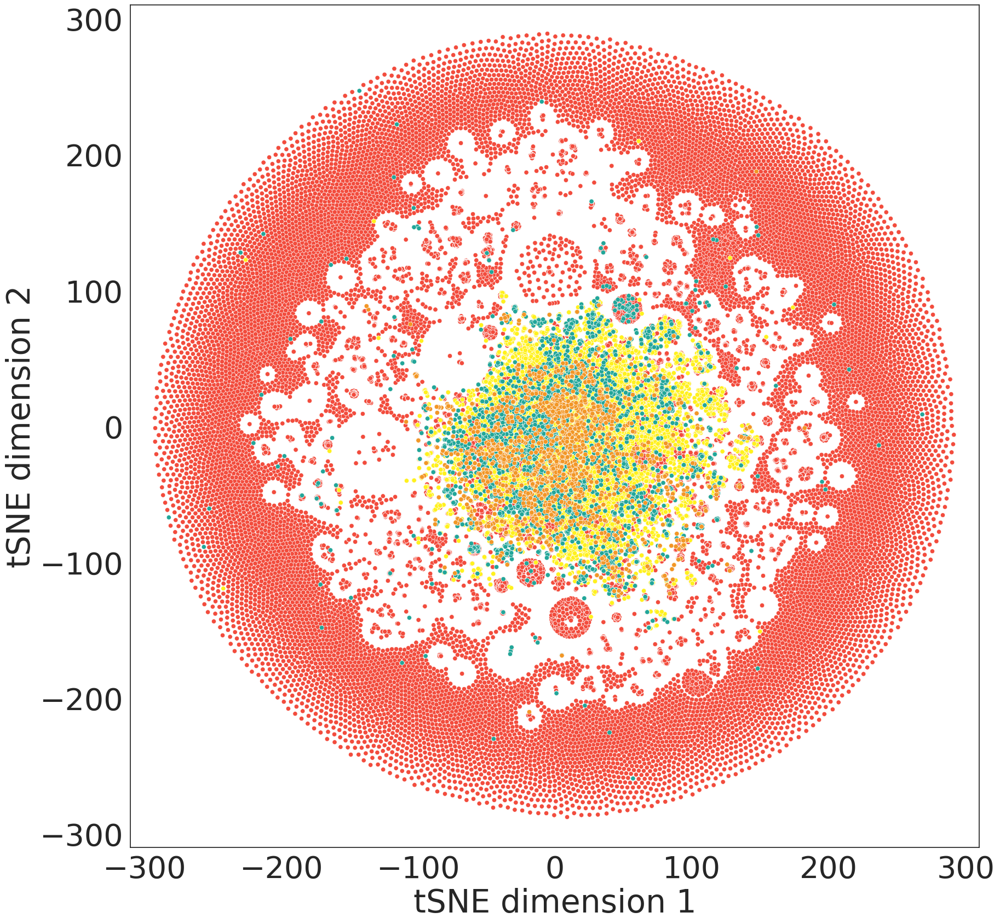

In [34]:
#tSNE visualization, ECFP6, four databases

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(20,20))
plt.xlabel("tSNE dimension 1", fontsize=42)
plt.ylabel("tSNE dimension 2", fontsize=42)
plt.tick_params(axis = 'both', labelsize = 40)
sns.set(font_scale=2.5)


#Scatterplot with selected palette
sns.scatterplot(
                x = tsne_dataset_ecfp6["Component1"],
                y = tsne_dataset_ecfp6["Component2"],
                hue = tsne_dataset_ecfp6["DATABASE_NAME"], #Labels
                palette=['#F24C3D', '#FFF11E', '#22A699', '#F29727']
                )

#Axis
plt.legend().remove()
plt.ylim(-310, 310)
plt.xlim(-310, 310)

#Save plot file
plt.savefig('tsne_ECFP6_2', dpi=300)

<Figure size 640x480 with 0 Axes>

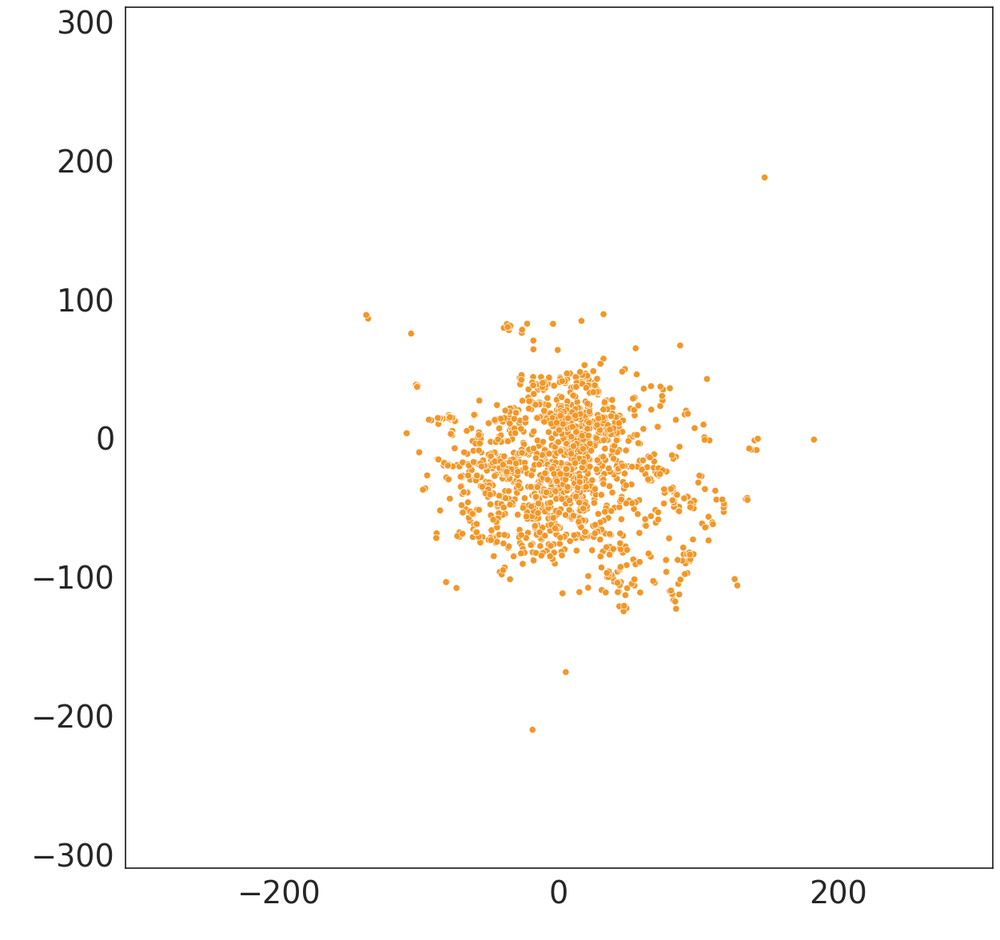

In [35]:
#tSNE visualization, ECFP6, DrugBank database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)

#Select one database
tsne_dataset_FDA_6 = tsne_dataset_ecfp6[tsne_dataset_ecfp6["DATABASE_NAME"].str.contains("drugbank")]

#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_FDA_6["Component1"],
                y = tsne_dataset_FDA_6["Component2"],
                hue = tsne_dataset_FDA_6["DATABASE_NAME"], 
                palette=['#F29727']
                )

#Axis
plt.legend().remove()
plt.ylim(-310, 310)
plt.xlim(-310, 310)

#Save plot file
plt.savefig('tsne_ECFP6_FDA_2', dpi=300)

<Figure size 640x480 with 0 Axes>

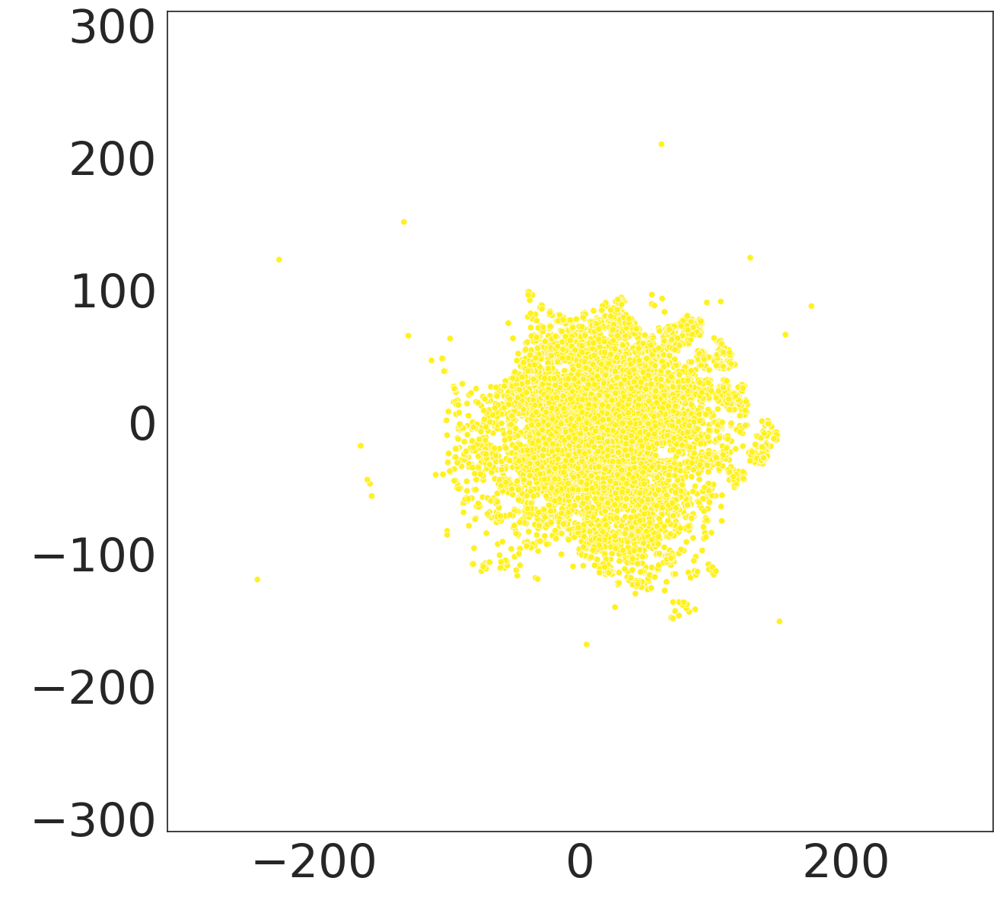

In [36]:
#tSNE visualization, ECFP6, UNPD-A database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)


#Select one database
tsne_dataset_UNP_6 = tsne_dataset_ecfp6[tsne_dataset_ecfp6["DATABASE_NAME"].str.contains("UNP")]

#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_UNP_6["Component1"],
                y = tsne_dataset_UNP_6["Component2"],
                hue = tsne_dataset_UNP_6["DATABASE_NAME"], 
                palette=['#FFF11E']
                )

#Axis
plt.legend().remove()
plt.ylim(-310, 310)
plt.xlim(-310, 310)

#Save plot file
plt.savefig('tsne_ECFP6_UNP_2', dpi=300)

<Figure size 640x480 with 0 Axes>

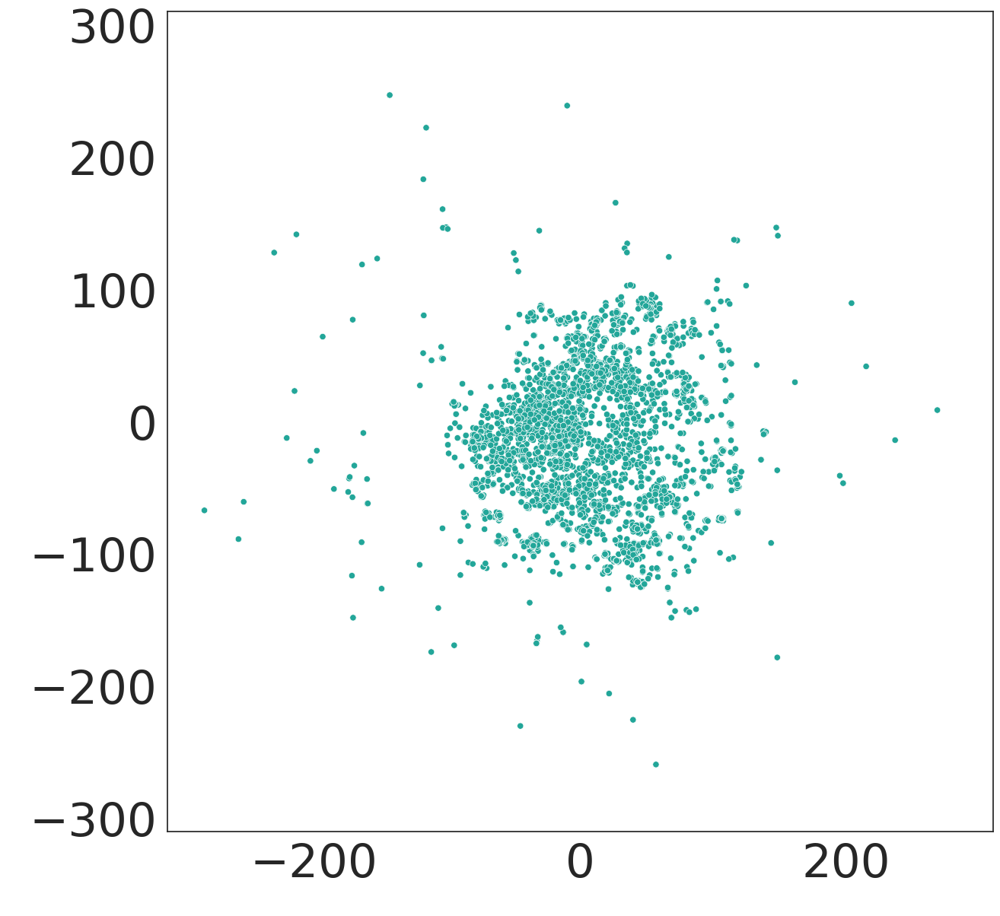

In [37]:
#tSNE visualization, ECFP6, Purchasable FooDB database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)

#Select one database
tsne_dataset_Purch_6 = tsne_dataset_ecfp6[tsne_dataset_ecfp6["DATABASE_NAME"].str.contains("PURCH")]

#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_Purch_6["Component1"],
                y = tsne_dataset_Purch_6["Component2"],
                hue = tsne_dataset_Purch_6["DATABASE_NAME"], 
                palette=['#22A699']
                )

#Axis
plt.legend().remove()
plt.ylim(-310, 310)
plt.xlim(-310, 310)

#Save plot file
plt.savefig('tsne_ECFP6_Purch_2', dpi=300)

<Figure size 640x480 with 0 Axes>

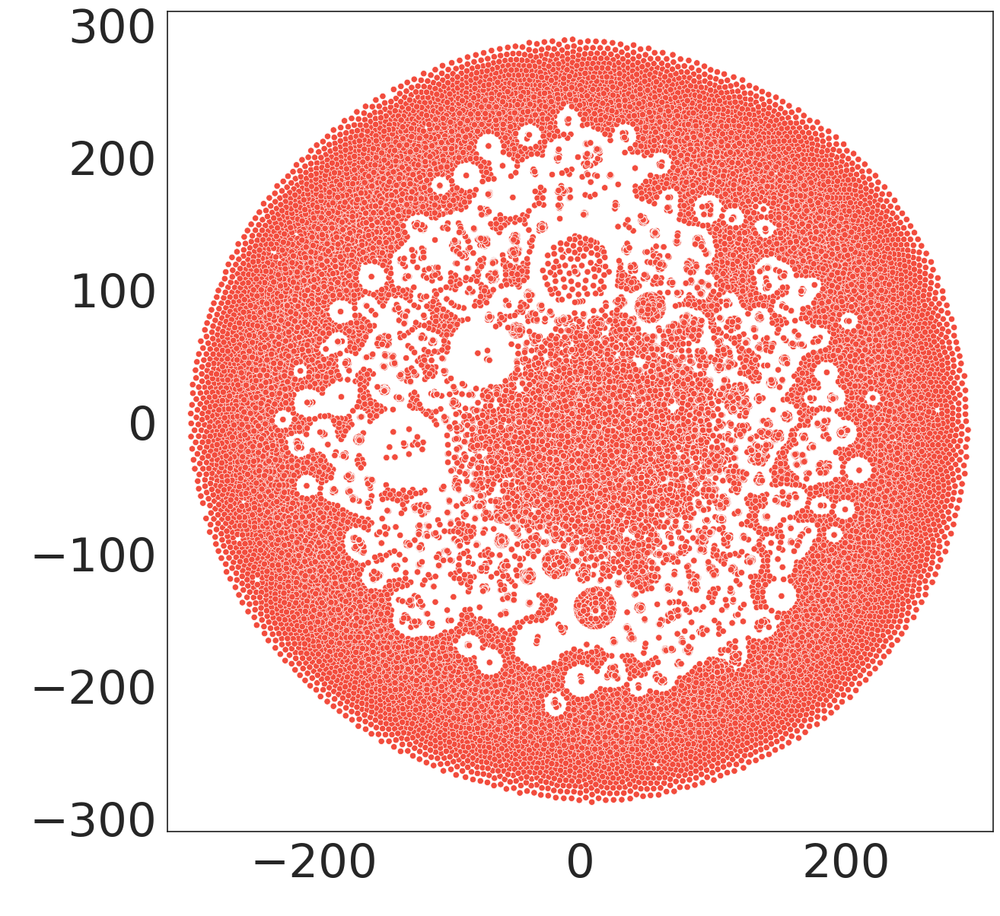

In [38]:
#tSNE visualization, ECFP6, FooDB database

#Set white background
sns.set_style("white")

#Figure and font sizes
plt.figure()
plt.figure(figsize=(14,14))
plt.xlabel(" ", fontsize=16)
plt.ylabel(" ", fontsize=16)
sns.set(font_scale=4)

#Select one database
tsne_dataset_Food_6 = tsne_dataset_ecfp6[tsne_dataset_ecfp6["DATABASE_NAME"].str.contains("FooDB")]

#Scatterplot with corresponding color
sns.scatterplot(
                x = tsne_dataset_Food_6["Component1"],
                y = tsne_dataset_Food_6["Component2"],
                hue = tsne_dataset_Food_6["DATABASE_NAME"], 
                palette=['#F24C3D']
                )

#Axis
plt.legend().remove()
plt.ylim(-310, 310)
plt.xlim(-310, 310)

#Save plot file
plt.savefig('tsne_ECFP6_Food_2', dpi=300)